In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:


# Load energy data
energy_df = pd.read_csv(r"C:\Users\Admin\Downloads\energy_ds\energy_dataset.csv", parse_dates=['time'], index_col='time')

# Load weather data
weather_df = pd.read_csv(r"C:\Users\Admin\Downloads\energy_ds\weather_features.csv", parse_dates=['dt_iso'], index_col='dt_iso')


In [3]:
# Energy data
energy_df.head()
energy_df.info()
energy_df.describe()



<class 'pandas.core.frame.DataFrame'>
Index: 35064 entries, 2015-01-01 00:00:00+01:00 to 2018-12-31 23:00:00+01:00
Data columns (total 28 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   generation biomass                           35045 non-null  float64
 1   generation fossil brown coal/lignite         35046 non-null  float64
 2   generation fossil coal-derived gas           35046 non-null  float64
 3   generation fossil gas                        35046 non-null  float64
 4   generation fossil hard coal                  35046 non-null  float64
 5   generation fossil oil                        35045 non-null  float64
 6   generation fossil oil shale                  35046 non-null  float64
 7   generation fossil peat                       35046 non-null  float64
 8   generation geothermal                        35046 non-null  float64
 9   generation hydro pumped storage a

,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage aggregated,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
count,35045.000000,35046.000000,35046.0,35046.000000,35046.000000,35045.000000,35046.0,35046.0,35046.0,0.0,...,35045.000000,35046.0,35046.000000,35064.000000,0.0,35064.000000,35064.000000,35028.000000,35064.000000,35064.000000
mean,383.513540,448.059208,0.0,5622.737488,4256.065742,298.319789,0.0,0.0,0.0,NaN,...,269.452133,0.0,5464.479769,1439.066735,NaN,5471.216689,28712.129962,28696.939905,49.874341,57.884023
std,85.353943,354.568590,0.0,2201.830478,1961.601013,52.520673,0.0,0.0,0.0,NaN,...,50.195536,0.0,3213.691587,1677.703355,NaN,3176.312853,4594.100854,4574.987950,14.618900,14.204083
min,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,NaN,...,0.000000,0.0,0.000000,0.000000,NaN,237.000000,18105.000000,18041.000000,2.060000,9.330000
25%,333.000000,0.000000,0.0,4126.000000,2527.000000,263.000000,0.0,0.0,0.0,NaN,...,240.000000,0.0,2933.000000,69.000000,NaN,2979.000000,24793.750000,24807.750000,41.490000,49.347500
50%,367.000000,509.000000,0.0,4969.000000,4474.000000,300.000000,0.0,0.0,0.0,NaN,...,279.000000,0.0,4849.000000,576.000000,NaN,4855.000000,28906.000000,28901.000000,50.520000,58.020000
75%,433.000000,757.000000,0.0,6429.000000,5838.750000,330.000000,0.0,0.0,0.0,NaN,...,310.000000,0.0,7398.000000,2636.000000,NaN,7353.000000,32263.250000,32192.000000,60.530000,68.010000
max,592.000000,999.000000,0.0,20034.000000,8359.000000,449.000000,0.0,0.0,0.0,NaN,...,357.000000,0.0,17436.000000,5836.000000,NaN,17430.000000,41390.000000,41015.000000,101.990000,116.800000


In [4]:
# Drop columns with all missing values
energy_df.drop(['generation hydro pumped storage aggregated', 'forecast wind offshore eday ahead'], axis=1, inplace=True)

# Impute missing values for columns with few missing values 
energy_df.fillna(energy_df.mean(), inplace=True)


In [5]:
# Weather data
weather_df.head()
weather_df.info()
weather_df.describe()

<class 'pandas.core.frame.DataFrame'>
Index: 178396 entries, 2015-01-01 00:00:00+01:00 to 2018-12-31 23:00:00+01:00
Data columns (total 16 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   city_name            178396 non-null  object 
 1   temp                 178396 non-null  float64
 2   temp_min             178396 non-null  float64
 3   temp_max             178396 non-null  float64
 4   pressure             178396 non-null  int64  
 5   humidity             178396 non-null  int64  
 6   wind_speed           178396 non-null  int64  
 7   wind_deg             178396 non-null  int64  
 8   rain_1h              178396 non-null  float64
 9   rain_3h              178396 non-null  float64
 10  snow_3h              178396 non-null  float64
 11  clouds_all           178396 non-null  int64  
 12  weather_id           178396 non-null  int64  
 13  weather_main         178396 non-null  object 
 14  weather_description  178396 no

,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id
count,178396.000000,178396.000000,178396.000000,1.783960e+05,178396.000000,178396.00000,178396.000000,178396.000000,178396.000000,178396.000000,178396.000000,178396.000000
mean,289.618605,288.330442,291.091267,1.069261e+03,68.423457,2.47056,166.591190,0.075492,0.000380,0.004763,25.073292,759.831902
std,8.026199,7.955491,8.612454,5.969632e+03,21.902888,2.09591,116.611927,0.398847,0.007288,0.222604,30.774129,108.733223
min,262.240000,262.240000,262.240000,0.000000e+00,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,200.000000
25%,283.670000,282.483602,284.650000,1.013000e+03,53.000000,1.00000,55.000000,0.000000,0.000000,0.000000,0.000000,800.000000
50%,289.150000,288.150000,290.150000,1.018000e+03,72.000000,2.00000,177.000000,0.000000,0.000000,0.000000,20.000000,800.000000
75%,295.150000,293.730125,297.150000,1.022000e+03,87.000000,4.00000,270.000000,0.000000,0.000000,0.000000,40.000000,801.000000
max,315.600000,315.150000,321.150000,1.008371e+06,100.000000,133.00000,360.000000,12.000000,2.315000,21.500000,100.000000,804.000000


In [6]:
# Assuming extreme values are incorrect,limiting them to a realistic range 
weather_df['pressure'] = weather_df['pressure'].apply(lambda x: np.nan if x > 1050 or x < 980 else x)
weather_df['pressure'].fillna(method='ffill', inplace=True) # Fill missing values forward


# merging two datasets 

In [8]:

combined_df = pd.merge(energy_df, weather_df, left_index=True, right_index=True, how='inner')


In [10]:
combined_df.head()

,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage consumption,...,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,863.0,...,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,863.0,...,1,309,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,863.0,...,0,226,0.0,0.0,0.0,0,800,clear,sky is clear,01
2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,863.0,...,7,58,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,863.0,...,1,21,0.0,0.0,0.0,0,800,clear,sky is clear,01n


<AxesSubplot:>

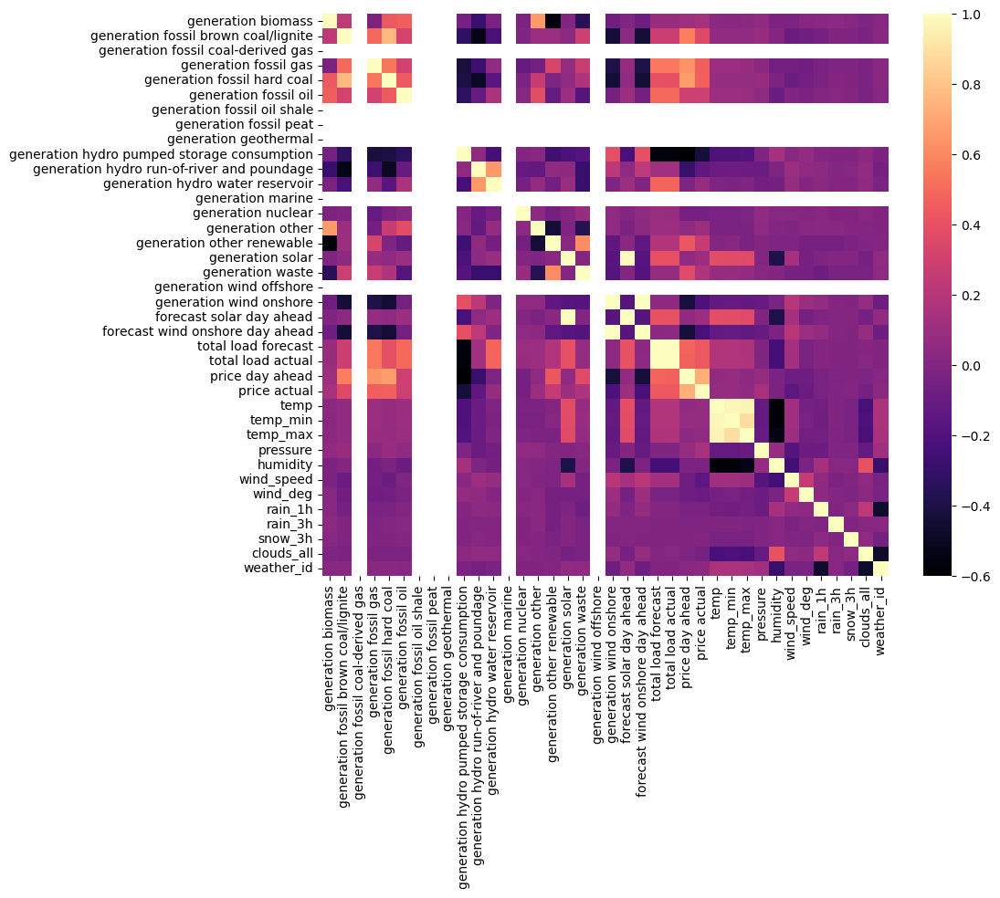

In [9]:
plt.figure(figsize=(10, 8))
sns.heatmap(combined_df.corr(), cmap='magma', annot=False)


In [10]:
correlation_matrix = combined_df.corr()


In [11]:

target_correlations = correlation_matrix['price actual'].sort_values(ascending=False)


In [12]:
print(target_correlations)


price actual                                   1.000000
price day ahead                                0.730636
generation fossil hard coal                    0.463559
generation fossil gas                          0.461357
total load forecast                            0.435944
total load actual                              0.435687
generation fossil brown coal/lignite           0.361955
generation fossil oil                          0.283442
generation other renewable                     0.257532
generation waste                               0.170089
pressure                                       0.143245
generation biomass                             0.139623
forecast solar day ahead                       0.100664
generation other                               0.099491
generation solar                               0.097677
temp_min                                       0.080857
generation hydro water reservoir               0.072315
temp                                           0

as we can see generation fossil coal-derived gas                 
generation fossil oil shale                         
generation fossil peat                             
generation geothermal                               
generation marine                                  
generation wind offshore columns has only zero value and they are not at all corelated to the "price actual" feature, so those columns should be dropped 

In [13]:
combined_df.drop(['generation fossil coal-derived gas', 'generation fossil oil shale', 'generation fossil peat','generation geothermal',
'generation marine','generation wind offshore'], axis=1, inplace=True)

In [14]:
combined_df.describe()

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,...,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id
count,178396.000000,178396.000000,178396.000000,178396.000000,178396.000000,178396.000000,178396.000000,178396.000000,178396.000000,178396.000000,...,178396.000000,178396.000000,178396.000000,178396.00000,178396.000000,178396.000000,178396.000000,178396.000000,178396.000000,178396.000000
mean,382.999276,448.256790,5626.252654,4254.163305,298.149742,475.121386,972.936927,2606.765019,6263.549486,60.160640,...,291.091267,1017.028269,68.423457,2.47056,166.591190,0.075492,0.000380,0.004763,25.073292,759.831902
std,85.233949,354.208202,2203.332159,1960.388721,52.450363,792.188271,400.867431,1835.467734,839.773835,20.207131,...,8.612454,8.931752,21.902888,2.09591,116.611927,0.398847,0.007288,0.222604,30.774129,108.733223
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,262.240000,980.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,200.000000
25%,333.000000,0.000000,4127.000000,2527.000000,263.000000,0.000000,638.000000,1079.000000,5758.000000,53.000000,...,284.650000,1013.000000,53.000000,1.00000,55.000000,0.000000,0.000000,0.000000,0.000000,800.000000
50%,366.000000,509.000000,4973.000000,4469.000000,300.000000,67.000000,907.000000,2167.000000,6561.000000,57.000000,...,290.150000,1018.000000,72.000000,2.00000,177.000000,0.000000,0.000000,0.000000,20.000000,800.000000
75%,429.000000,756.000000,6434.000000,5835.000000,329.000000,615.000000,1251.000000,3758.000000,7025.000000,80.000000,...,297.150000,1022.000000,87.000000,4.00000,270.000000,0.000000,0.000000,0.000000,40.000000,801.000000
max,592.000000,999.000000,20034.000000,8359.000000,449.000000,4523.000000,2000.000000,9728.000000,7117.000000,106.000000,...,321.150000,1048.000000,100.000000,133.00000,360.000000,12.000000,2.315000,21.500000,100.000000,804.000000


In [15]:
# Convert index to DateTime 
# combined_df.index = pd.to_datetime(combined_df.index)
# Convert to UTC to avoid timezone issues, then remove timezone information
combined_df.index = pd.to_datetime(combined_df.index, utc=True).tz_localize(None)


# Visualizations

<AxesSubplot:xlabel='temp', ylabel='price actual'>

C:\Users\Admin\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


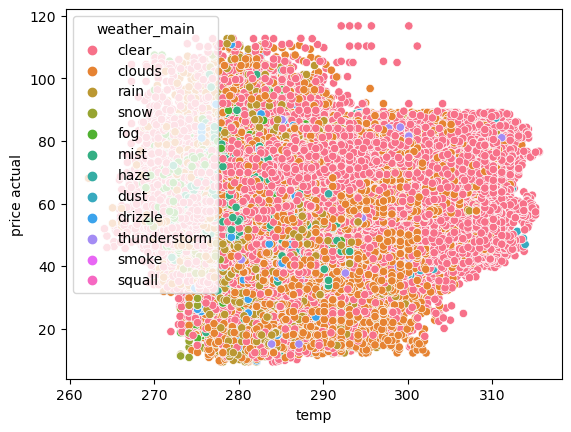

In [19]:
sns.scatterplot(data=combined_df, x='temp', y='price actual', hue='weather_main')


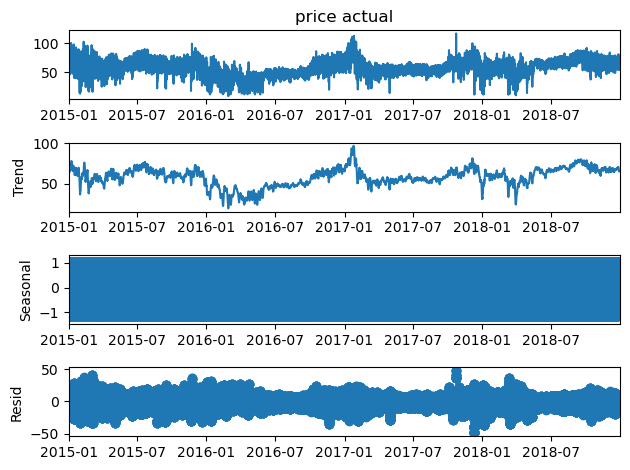

In [21]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Decomposing 'price actual' time series
decompose_result = seasonal_decompose(combined_df['price actual'], model='additive', period=365)

# Plotting the decomposed time series
decompose_result.plot()
plt.show()


In [22]:
import plotly.express as px

fig = px.line(combined_df, x=combined_df.index, y='price actual', title='Interactive Time Series of Energy Prices')
fig.update_xaxes(title_text='Time')
fig.update_yaxes(title_text='Price Actual')
fig.show()


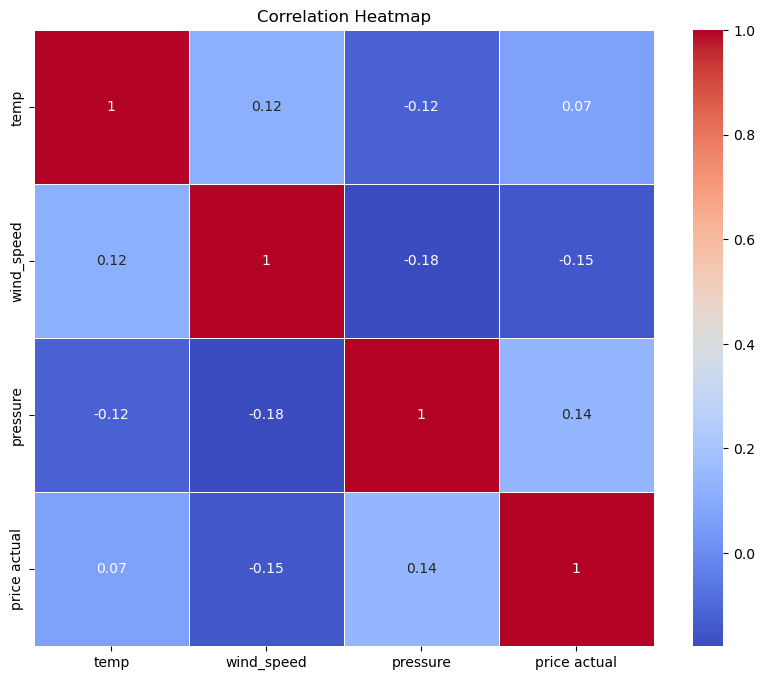

In [23]:
corr = combined_df[['temp', 'wind_speed', 'pressure', 'price actual']].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()


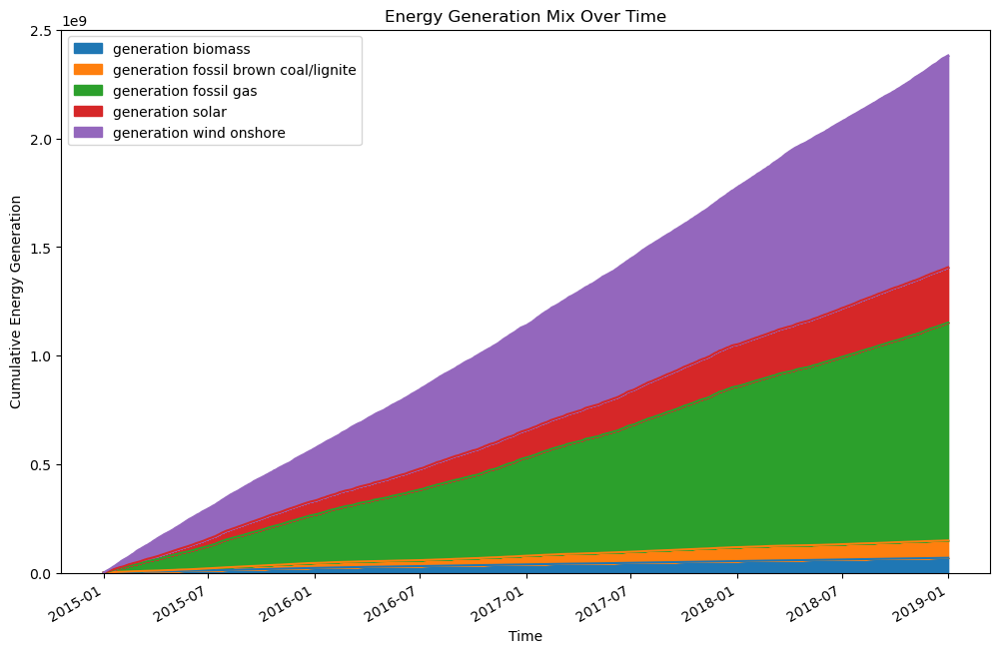

In [24]:

energy_columns = ['generation biomass', 'generation fossil brown coal/lignite', 'generation fossil gas', 'generation solar', 'generation wind onshore']
combined_df[energy_columns] = combined_df[energy_columns].cumsum()  
combined_df[energy_columns].plot.area(figsize=(12, 8), title='Energy Generation Mix Over Time')
plt.xlabel('Time')
plt.ylabel('Cumulative Energy Generation')
plt.legend(loc='upper left')
plt.show()


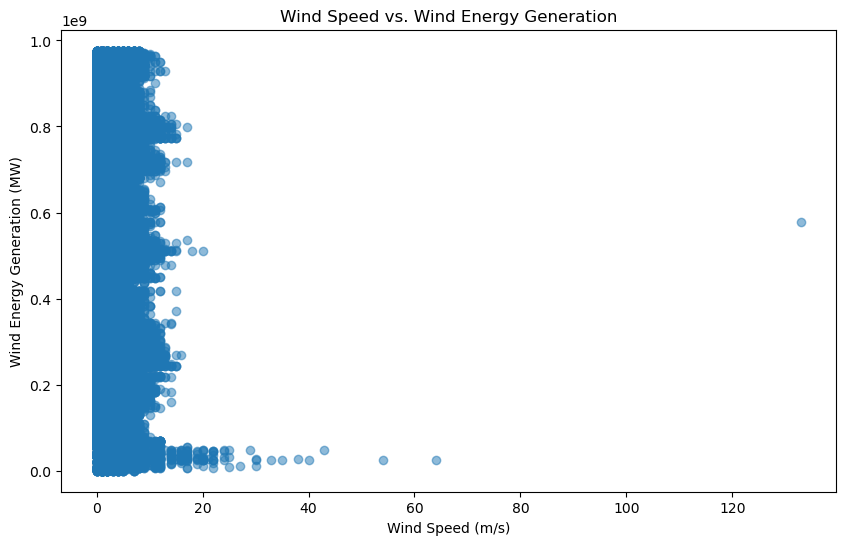

In [25]:
# Scatter plot of wind speed vs. wind generation
plt.figure(figsize=(10, 6))
plt.scatter(combined_df['wind_speed'], combined_df['generation wind onshore'], alpha=0.5)
plt.title('Wind Speed vs. Wind Energy Generation')
plt.xlabel('Wind Speed (m/s)')
plt.ylabel('Wind Energy Generation (MW)')
plt.show()


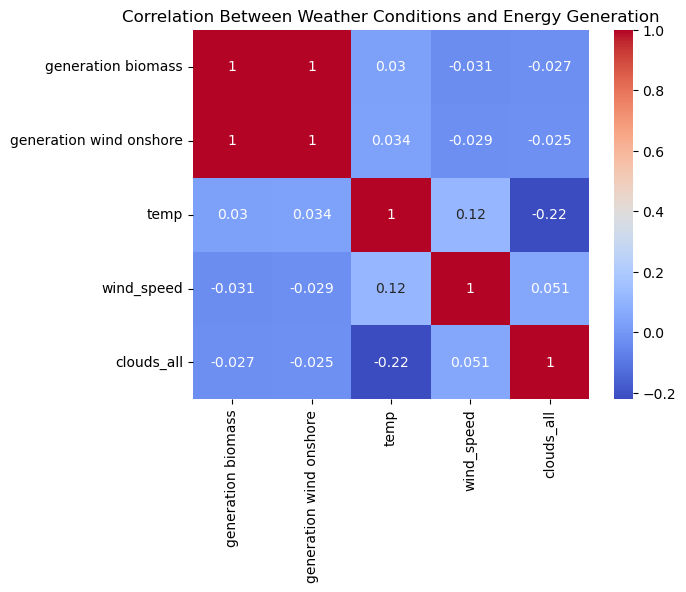

In [26]:
weather_energy_columns = ['generation biomass', 'generation wind onshore', 'temp', 'wind_speed', 'clouds_all']
corr_matrix = combined_df[weather_energy_columns].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Between Weather Conditions and Energy Generation')
plt.show()


we can see that "generation biomass" and "generation wind onshore" are highly corelated 

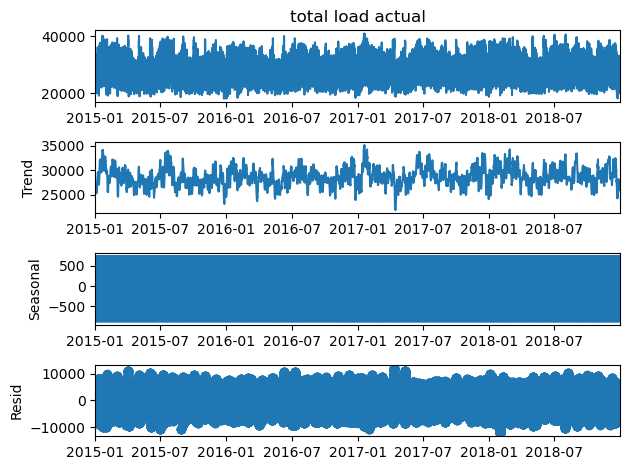

In [27]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt


result = seasonal_decompose(combined_df['total load actual'], model='additive', period=365)
result.plot()
plt.show()


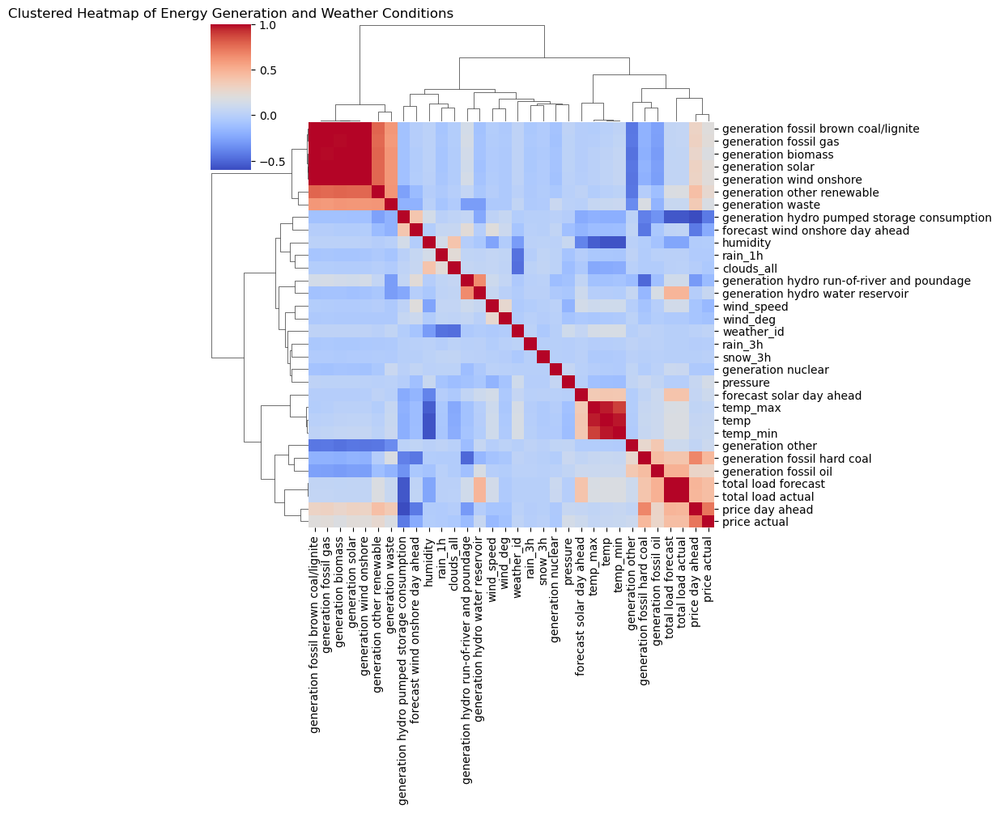

In [28]:
import seaborn as sns


sns.clustermap(combined_df.corr(), method='ward', metric='euclidean', cmap='coolwarm', figsize=(10, 10))
plt.title('Clustered Heatmap of Energy Generation and Weather Conditions')
plt.show()


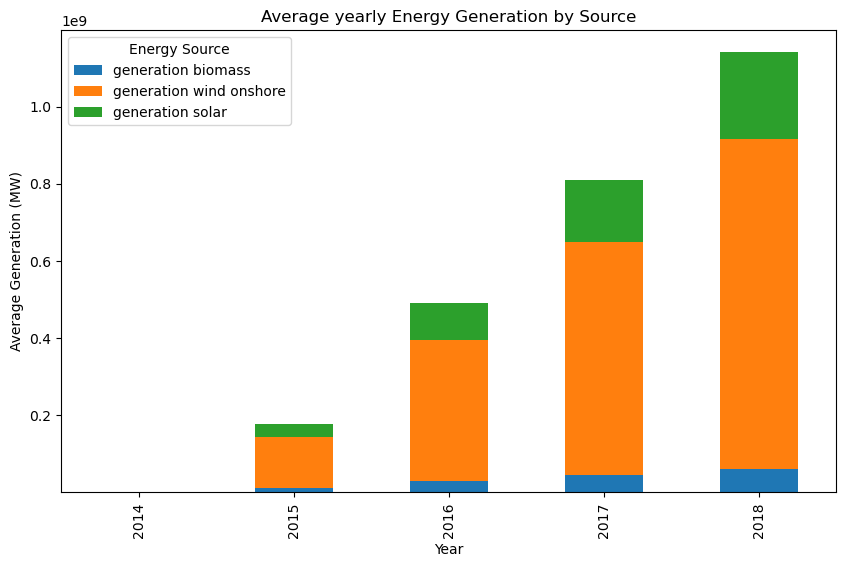

In [29]:
# group by year
combined_df.groupby(combined_df.index.year)[['generation biomass', 'generation wind onshore', 'generation solar']].mean().plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Average yearly Energy Generation by Source')
plt.xlabel('Year')
plt.ylabel('Average Generation (MW)')
plt.legend(title='Energy Source')


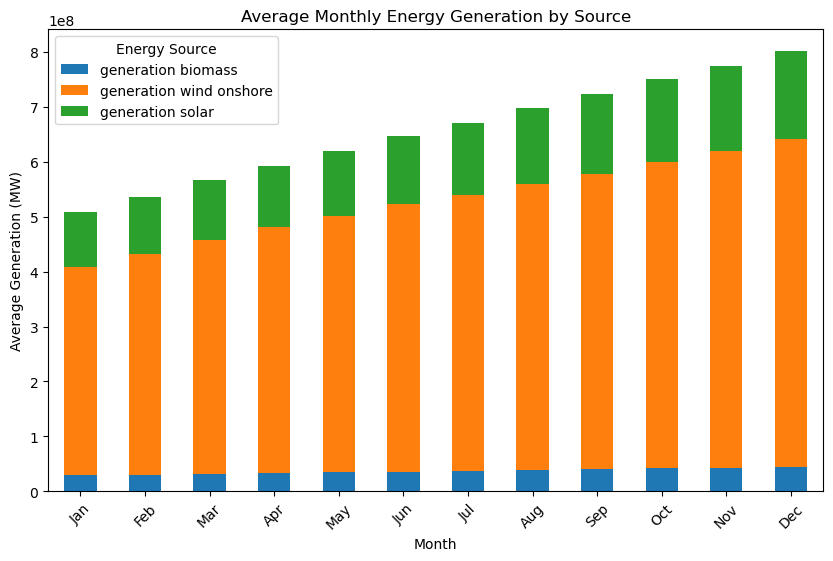

In [30]:
#  group by month and plot
combined_df.groupby(combined_df.index.month)[['generation biomass', 'generation wind onshore', 'generation solar']].mean().plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title('Average Monthly Energy Generation by Source')
plt.xlabel('Month')
plt.ylabel('Average Generation (MW)')
plt.legend(title='Energy Source')
plt.xticks(ticks=range(0, 12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)  # Adjust x-ticks to show month names
plt.show()


## Weather Impact on Energy Prices Line Chart

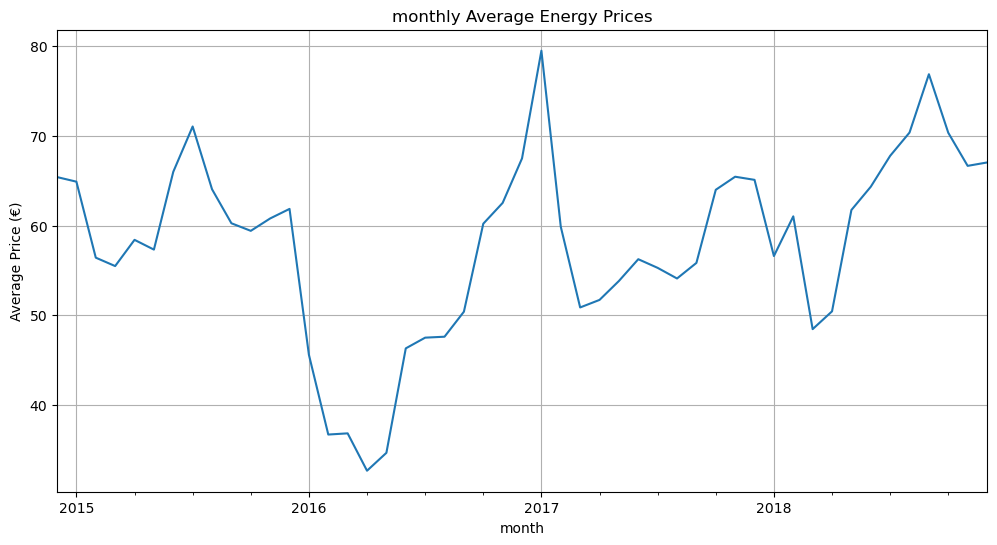

In [31]:
plt.figure(figsize=(12, 6))
combined_df.resample('M').mean()['price actual'].plot()
plt.title('monthly Average Energy Prices')
plt.xlabel('month')
plt.ylabel('Average Price (€)')
plt.grid(True)
plt.show()


## Proportion of Energy Generated by Source Pie Chart

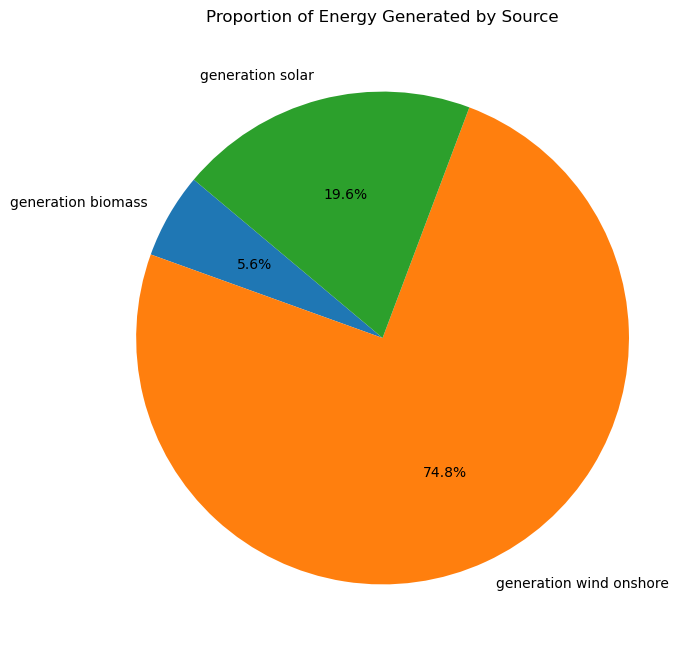

In [32]:
energy_sources = ['generation biomass', 'generation wind onshore', 'generation solar']
energy_generation = combined_df[energy_sources].mean()
plt.figure(figsize=(8, 8))
plt.pie(energy_generation, labels=energy_sources, autopct='%1.1f%%', startangle=140)
plt.title('Proportion of Energy Generated by Source')
plt.show()


## Wind Speed vs. Energy Generation Scatter Plot with Regression Line

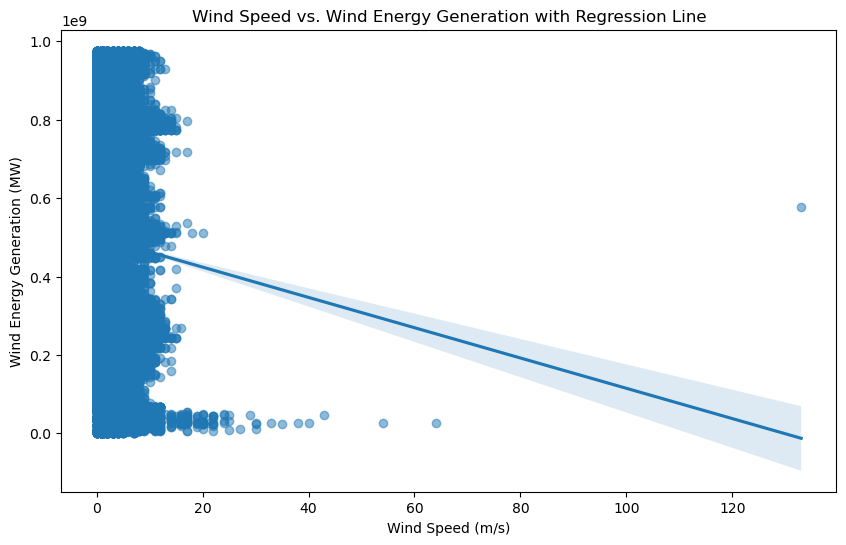

In [33]:
plt.figure(figsize=(10, 6))
sns.regplot(x='wind_speed', y='generation wind onshore', data=combined_df, scatter_kws={'alpha':0.5})
plt.title('Wind Speed vs. Wind Energy Generation with Regression Line')
plt.xlabel('Wind Speed (m/s)')
plt.ylabel('Wind Energy Generation (MW)')
plt.show()


## Bar Graph of Average Energy Generation by Hour of Day

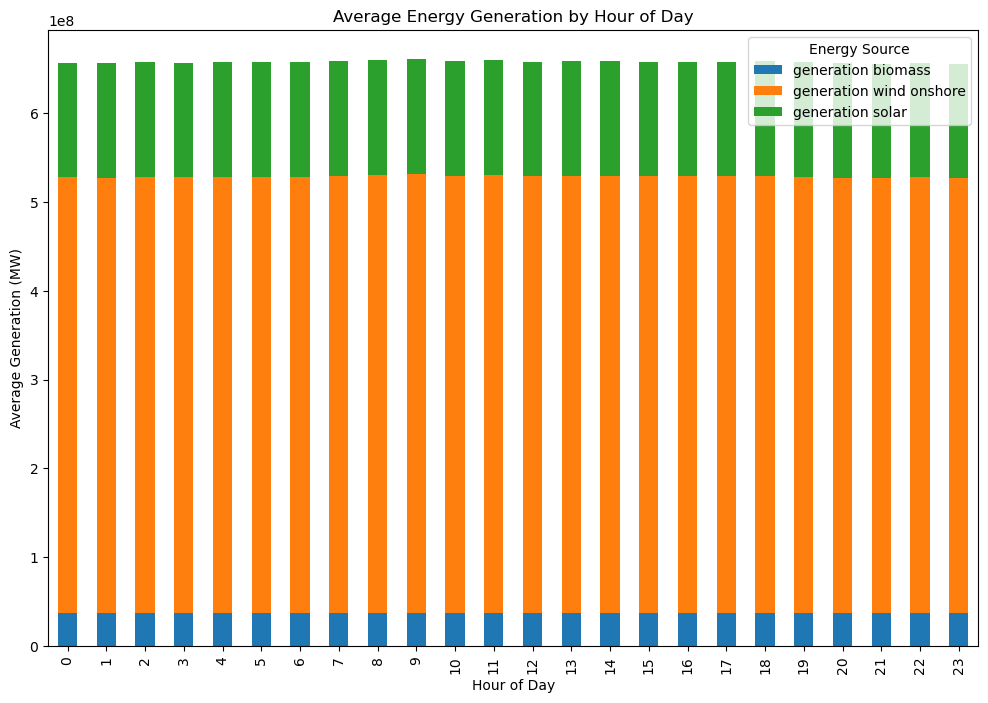

In [34]:
combined_df['hour'] = combined_df.index.hour
energy_generation_hourly = combined_df.groupby('hour')[['generation biomass', 'generation wind onshore', 'generation solar']].mean()

energy_generation_hourly.plot(kind='bar', stacked=True, figsize=(12, 8))
plt.title('Average Energy Generation by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Generation (MW)')
plt.legend(title='Energy Source')
plt.show()
